In [ ]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/audio-dataset-with-10-indian-languages/Language Detection Dataset/Punjabi/23694.mp3
/kaggle/input/audio-dataset-with-10-indian-languages/Language Detection Dataset/Punjabi/13738.mp3
/kaggle/input/audio-dataset-with-10-indian-languages/Language Detection Dataset/Punjabi/13802.mp3
/kaggle/input/audio-dataset-with-10-indian-languages/Language Detection Dataset/Punjabi/19496.mp3
/kaggle/input/audio-dataset-with-10-indian-languages/Language Detection Dataset/Punjabi/11507.mp3
/kaggle/input/audio-dataset-with-10-indian-languages/Language Detection Dataset/Punjabi/3282.mp3
/kaggle/input/audio-dataset-with-10-indian-languages/Language Detection Dataset/Punjabi/11014.mp3
/kaggle/input/audio-dataset-with-10-indian-languages/Language Detection Dataset/Punjabi/8142.mp3
/kaggle/input/audio-dataset-with-10-indian-languages/Language Detection Dataset/Punjabi/3614.mp3
/kaggle/input/audio-dataset-with-10-indian-languages/Language Detection Dataset/Punjabi/5313.mp3
/kaggle/input/audio-data

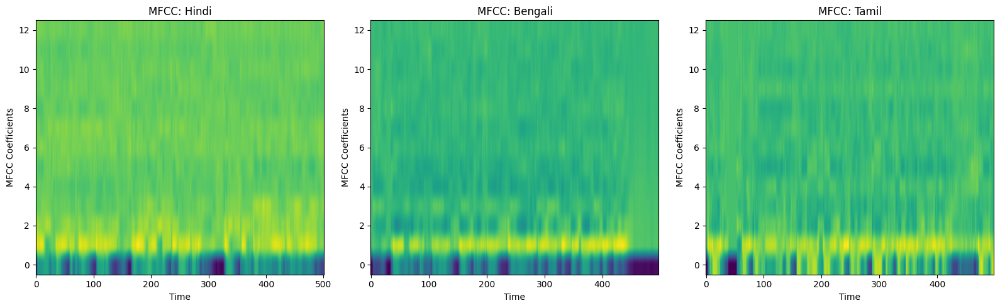


--- MFCC Statistics ---

Language: Hindi
Mean: [-162.04   42.16   17.96    1.09  -15.75  -13.48    1.15    2.99   -9.33
   -7.86   -5.53  -11.3    -1.86]
Variance: [6075.2  1156.86  321.07  324.2    87.27  134.02   73.7    86.77   81.35
   69.66   57.27   45.7    49.86]

Language: Bengali
Mean: [-1.5191e+02  7.1330e+01 -1.6460e+01  8.0000e-02 -2.7460e+01 -1.9410e+01
 -8.7800e+00 -1.4280e+01 -6.4700e+00 -8.5200e+00 -1.1540e+01 -8.7200e+00
 -4.9300e+00]
Variance: [5387.08 1254.72 1093.58  276.49  340.93  229.56   79.84  118.74  100.07
   56.57   66.11   65.94   38.03]

Language: Tamil
Mean: [-38.58  51.15  -6.67 -13.71  -3.74 -16.39  -8.34  -8.26 -12.68  -1.66
 -10.21  -5.62  -3.22]
Variance: [6051.08  628.74  438.81  191.32  112.82  290.5    95.45   96.25  111.98
   43.53   61.93   55.86   27.78]


In [7]:
import os
import torchaudio
import torchaudio.transforms as T
import matplotlib.pyplot as plt
import numpy as np

# Define path to dataset
BASE_PATH = '/kaggle/input/audio-dataset-with-10-indian-languages/Language Detection Dataset'
languages = ['Hindi', 'Bengali', 'Tamil']  # You can change/add more languages

# Initialize MFCC extractor
mfcc_transform = T.MFCC(
    sample_rate=16000,
    n_mfcc=13,
    melkwargs={'n_fft': 400, 'hop_length': 160, 'n_mels': 40}
)

# Store MFCCs for each language
mfcc_data = {}
stats_data = {}

for lang in languages:
    lang_path = os.path.join(BASE_PATH, lang)
    
    # Get first sample file (you can expand this to more files)
    sample_file = os.listdir(lang_path)[0]
    sample_path = os.path.join(lang_path, sample_file)

    # Load waveform
    waveform, sample_rate = torchaudio.load(sample_path)

    # Convert stereo to mono if needed
    if waveform.shape[0] > 1:
        waveform = waveform.mean(dim=0, keepdim=True)

    # Resample to 16kHz if necessary
    if sample_rate != 16000:
        resampler = T.Resample(orig_freq=sample_rate, new_freq=16000)
        waveform = resampler(waveform)

    # Extract MFCC
    mfcc = mfcc_transform(waveform)  # Shape: [1, n_mfcc, time]
    mfcc_np = mfcc.squeeze(0).numpy().T  # Shape: [time, n_mfcc]

    mfcc_data[lang] = mfcc_np

    # Optional: compute statistics
    mean_vals = np.mean(mfcc_np, axis=0)
    var_vals = np.var(mfcc_np, axis=0)
    stats_data[lang] = {'mean': mean_vals, 'variance': var_vals}

# Plot MFCC spectrograms
fig, axs = plt.subplots(1, len(languages), figsize=(16, 5))

for idx, lang in enumerate(languages):
    axs[idx].imshow(mfcc_data[lang].T, origin='lower', aspect='auto', cmap='viridis')
    axs[idx].set_title(f'MFCC: {lang}')
    axs[idx].set_xlabel('Time')
    axs[idx].set_ylabel('MFCC Coefficients')

plt.tight_layout()
plt.show()

# Print mean and variance for each language
print("\n--- MFCC Statistics ---")
for lang in languages:
    print(f"\nLanguage: {lang}")
    print("Mean:", np.round(stats_data[lang]['mean'], 2))
    print("Variance:", np.round(stats_data[lang]['variance'], 2))


In [14]:
import os
import numpy as np
import librosa
import joblib
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import classification_report, confusion_matrix

# -----------------------------
# CONFIGURATION
# -----------------------------
AUDIO_DIR = '/kaggle/input/audio-dataset-with-10-indian-languages'
SR = 22050                  # Sampling rate
N_MFCC = 13                 # Number of MFCCs to extract
TEST_SIZE = 0.2             # Train-test split ratio
RANDOM_STATE = 42           # Reproducibility
AUDIO_EXTENSIONS = (".wav", ".mp3", ".flac", ".ogg", ".m4a")
MIN_DURATION = 1.0          # Minimum duration (in seconds) to accept a file

# -----------------------------
# FUNCTION: Extract MFCC from one audio file
# -----------------------------
def extract_mfcc_features(file_path, n_mfcc=N_MFCC):
    try:
        y, sr = librosa.load(file_path, sr=SR)
        duration = librosa.get_duration(y=y, sr=sr)
        
        if duration < MIN_DURATION:
            print(f"[WARNING] Skipping {file_path} (too short: {duration:.2f}s)")
            return None

        mfcc = librosa.feature.mfcc(y=y, sr=sr, n_mfcc=n_mfcc)
        mfcc_mean = np.mean(mfcc, axis=1)  # Average over time axis
        return mfcc_mean
    except Exception as e:
        print(f"[ERROR] Could not process {file_path}: {e}")
        return None

# -----------------------------
# FUNCTION: Load dataset
# -----------------------------
def load_dataset(audio_dir):
    features = []
    labels = []
    languages = sorted(os.listdir(audio_dir))

    for language in languages:
        language_dir = os.path.join(audio_dir, language)
        if not os.path.isdir(language_dir):
            continue

        print(f"[INFO] Processing language: {language}")
        for root, _, files in os.walk(language_dir):
            for file in files:
                if file.lower().endswith(AUDIO_EXTENSIONS):
                    file_path = os.path.join(root, file)
                    mfcc = extract_mfcc_features(file_path)
                    if mfcc is not None:
                        features.append(mfcc)
                        labels.append(language)

    if not features:
        raise RuntimeError("No valid audio files found. Check AUDIO_DIR and file types.")

    return np.array(features), np.array(labels)

# -----------------------------
# FUNCTION: Train classifier
# -----------------------------
def train_classifier(X_train, y_train):
    model = RandomForestClassifier(n_estimators=100, random_state=RANDOM_STATE)
    model.fit(X_train, y_train)
    return model

# -----------------------------
# MAIN WORKFLOW
# -----------------------------
def main():
    print("[INFO] Loading dataset...")
    X, y = load_dataset(AUDIO_DIR)

    print(f"[INFO] Loaded {len(X)} samples.")

    print("[INFO] Scaling features...")
    scaler = StandardScaler()
    X_scaled = scaler.fit_transform(X)

    print("[INFO] Splitting into train and test sets...")
    X_train, X_test, y_train, y_test = train_test_split(
        X_scaled, y, test_size=TEST_SIZE, random_state=RANDOM_STATE)

    print("[INFO] Training classifier...")
    model = train_classifier(X_train, y_train)

    print("[INFO] Evaluating model...")
    y_pred = model.predict(X_test)

    print("\nClassification Report:\n")
    print(classification_report(y_test, y_pred))

    print("\nConfusion Matrix:\n")
    print(confusion_matrix(y_test, y_pred))

    print("[INFO] Saving model and scaler...")
    joblib.dump(model, "language_classifier.pkl")
    joblib.dump(scaler, "scaler.pkl")
    print("[INFO] Done.")

if __name__ == "__main__":
    main()


[INFO] Loading dataset...
[INFO] Processing language: Language Detection Dataset
[WARNING] Skipping /kaggle/input/audio-dataset-with-10-indian-languages/Language Detection Dataset/Punjabi/6106.mp3 (too short: 0.05s)
[WARNING] Skipping /kaggle/input/audio-dataset-with-10-indian-languages/Language Detection Dataset/Punjabi/16076.mp3 (too short: 0.05s)


<ipython-input-14-fa81b508932d>:26: UserWarning: PySoundFile failed. Trying audioread instead.
  y, sr = librosa.load(file_path, sr=SR)
/usr/local/lib/python3.10/dist-packages/librosa/core/audio.py:184: FutureWarning: librosa.core.audio.__audioread_load
	Deprecated as of librosa version 0.10.0.
	It will be removed in librosa version 1.0.
  y, sr_native = __audioread_load(path, offset, duration, dtype)


[WARNING] Skipping /kaggle/input/audio-dataset-with-10-indian-languages/Language Detection Dataset/Punjabi/11254.mp3 (too short: 0.03s)
[WARNING] Skipping /kaggle/input/audio-dataset-with-10-indian-languages/Language Detection Dataset/Punjabi/16636.mp3 (too short: 0.36s)
[WARNING] Skipping /kaggle/input/audio-dataset-with-10-indian-languages/Language Detection Dataset/Punjabi/2484.mp3 (too short: 0.61s)
[WARNING] Skipping /kaggle/input/audio-dataset-with-10-indian-languages/Language Detection Dataset/Punjabi/4915.mp3 (too short: 0.45s)
[WARNING] Skipping /kaggle/input/audio-dataset-with-10-indian-languages/Language Detection Dataset/Punjabi/24895.mp3 (too short: 0.27s)
[WARNING] Skipping /kaggle/input/audio-dataset-with-10-indian-languages/Language Detection Dataset/Punjabi/9101.mp3 (too short: 0.60s)
[WARNING] Skipping /kaggle/input/audio-dataset-with-10-indian-languages/Language Detection Dataset/Punjabi/11038.mp3 (too short: 0.84s)
[WARNING] Skipping /kaggle/input/audio-dataset-with

<ipython-input-14-fa81b508932d>:26: UserWarning: PySoundFile failed. Trying audioread instead.
  y, sr = librosa.load(file_path, sr=SR)
/usr/local/lib/python3.10/dist-packages/librosa/core/audio.py:184: FutureWarning: librosa.core.audio.__audioread_load
	Deprecated as of librosa version 0.10.0.
	It will be removed in librosa version 1.0.
  y, sr_native = __audioread_load(path, offset, duration, dtype)


[WARNING] Skipping /kaggle/input/audio-dataset-with-10-indian-languages/Language Detection Dataset/Punjabi/4063.mp3 (too short: 0.01s)
[WARNING] Skipping /kaggle/input/audio-dataset-with-10-indian-languages/Language Detection Dataset/Punjabi/10615.mp3 (too short: 0.62s)
[WARNING] Skipping /kaggle/input/audio-dataset-with-10-indian-languages/Language Detection Dataset/Punjabi/3754.mp3 (too short: 0.69s)
[ERROR] Could not process /kaggle/input/audio-dataset-with-10-indian-languages/Language Detection Dataset/Punjabi/1887.mp3: frames must be specified for non-seekable files
[ERROR] Could not process /kaggle/input/audio-dataset-with-10-indian-languages/Language Detection Dataset/Punjabi/19149.mp3: frames must be specified for non-seekable files
[WARNING] Skipping /kaggle/input/audio-dataset-with-10-indian-languages/Language Detection Dataset/Punjabi/22530.mp3 (too short: 0.74s)
[WARNING] Skipping /kaggle/input/audio-dataset-with-10-indian-languages/Language Detection Dataset/Punjabi/8980.m

<ipython-input-14-fa81b508932d>:26: UserWarning: PySoundFile failed. Trying audioread instead.
  y, sr = librosa.load(file_path, sr=SR)
/usr/local/lib/python3.10/dist-packages/librosa/core/audio.py:184: FutureWarning: librosa.core.audio.__audioread_load
	Deprecated as of librosa version 0.10.0.
	It will be removed in librosa version 1.0.
  y, sr_native = __audioread_load(path, offset, duration, dtype)


[ERROR] Could not process /kaggle/input/audio-dataset-with-10-indian-languages/Language Detection Dataset/Tamil/23613.mp3: 
[WARNING] Skipping /kaggle/input/audio-dataset-with-10-indian-languages/Language Detection Dataset/Tamil/21471.mp3 (too short: 0.11s)
[WARNING] Skipping /kaggle/input/audio-dataset-with-10-indian-languages/Language Detection Dataset/Tamil/25211.mp3 (too short: 0.06s)
[WARNING] Skipping /kaggle/input/audio-dataset-with-10-indian-languages/Language Detection Dataset/Tamil/16474.mp3 (too short: 0.49s)
[WARNING] Skipping /kaggle/input/audio-dataset-with-10-indian-languages/Language Detection Dataset/Tamil/25237.mp3 (too short: 0.93s)
[WARNING] Skipping /kaggle/input/audio-dataset-with-10-indian-languages/Language Detection Dataset/Tamil/5562.mp3 (too short: 0.22s)
[WARNING] Skipping /kaggle/input/audio-dataset-with-10-indian-languages/Language Detection Dataset/Tamil/15232.mp3 (too short: 0.60s)
[WARNING] Skipping /kaggle/input/audio-dataset-with-10-indian-languages/L

<ipython-input-14-fa81b508932d>:26: UserWarning: PySoundFile failed. Trying audioread instead.
  y, sr = librosa.load(file_path, sr=SR)
/usr/local/lib/python3.10/dist-packages/librosa/core/audio.py:184: FutureWarning: librosa.core.audio.__audioread_load
	Deprecated as of librosa version 0.10.0.
	It will be removed in librosa version 1.0.
  y, sr_native = __audioread_load(path, offset, duration, dtype)


[WARNING] Skipping /kaggle/input/audio-dataset-with-10-indian-languages/Language Detection Dataset/Gujarati/5774.mp3 (too short: 0.03s)
[WARNING] Skipping /kaggle/input/audio-dataset-with-10-indian-languages/Language Detection Dataset/Gujarati/10831.mp3 (too short: 0.05s)
[WARNING] Skipping /kaggle/input/audio-dataset-with-10-indian-languages/Language Detection Dataset/Gujarati/19800.mp3 (too short: 0.61s)
[WARNING] Skipping /kaggle/input/audio-dataset-with-10-indian-languages/Language Detection Dataset/Gujarati/1820.mp3 (too short: 0.51s)
[WARNING] Skipping /kaggle/input/audio-dataset-with-10-indian-languages/Language Detection Dataset/Gujarati/11766.mp3 (too short: 0.84s)
[WARNING] Skipping /kaggle/input/audio-dataset-with-10-indian-languages/Language Detection Dataset/Gujarati/20461.mp3 (too short: 0.12s)
[WARNING] Skipping /kaggle/input/audio-dataset-with-10-indian-languages/Language Detection Dataset/Gujarati/16271.mp3 (too short: 0.27s)
[WARNING] Skipping /kaggle/input/audio-data

<ipython-input-14-fa81b508932d>:26: UserWarning: PySoundFile failed. Trying audioread instead.
  y, sr = librosa.load(file_path, sr=SR)
/usr/local/lib/python3.10/dist-packages/librosa/core/audio.py:184: FutureWarning: librosa.core.audio.__audioread_load
	Deprecated as of librosa version 0.10.0.
	It will be removed in librosa version 1.0.
  y, sr_native = __audioread_load(path, offset, duration, dtype)


[WARNING] Skipping /kaggle/input/audio-dataset-with-10-indian-languages/Language Detection Dataset/Gujarati/12867.mp3 (too short: 0.01s)
[WARNING] Skipping /kaggle/input/audio-dataset-with-10-indian-languages/Language Detection Dataset/Gujarati/5768.mp3 (too short: 0.60s)
[WARNING] Skipping /kaggle/input/audio-dataset-with-10-indian-languages/Language Detection Dataset/Gujarati/5189.mp3 (too short: 0.25s)
[ERROR] Could not process /kaggle/input/audio-dataset-with-10-indian-languages/Language Detection Dataset/Gujarati/18532.mp3: frames must be specified for non-seekable files
[WARNING] Skipping /kaggle/input/audio-dataset-with-10-indian-languages/Language Detection Dataset/Gujarati/8896.mp3 (too short: 0.27s)
[WARNING] Skipping /kaggle/input/audio-dataset-with-10-indian-languages/Language Detection Dataset/Gujarati/8674.mp3 (too short: 0.40s)
[ERROR] Could not process /kaggle/input/audio-dataset-with-10-indian-languages/Language Detection Dataset/Urdu/5339.mp3: frames must be specified

<ipython-input-14-fa81b508932d>:26: UserWarning: PySoundFile failed. Trying audioread instead.
  y, sr = librosa.load(file_path, sr=SR)
/usr/local/lib/python3.10/dist-packages/librosa/core/audio.py:184: FutureWarning: librosa.core.audio.__audioread_load
	Deprecated as of librosa version 0.10.0.
	It will be removed in librosa version 1.0.
  y, sr_native = __audioread_load(path, offset, duration, dtype)


[WARNING] Skipping /kaggle/input/audio-dataset-with-10-indian-languages/Language Detection Dataset/Urdu/28349.mp3 (too short: 0.02s)
[WARNING] Skipping /kaggle/input/audio-dataset-with-10-indian-languages/Language Detection Dataset/Urdu/5115.mp3 (too short: 0.07s)
[WARNING] Skipping /kaggle/input/audio-dataset-with-10-indian-languages/Language Detection Dataset/Urdu/73.mp3 (too short: 0.28s)
[WARNING] Skipping /kaggle/input/audio-dataset-with-10-indian-languages/Language Detection Dataset/Urdu/11217.mp3 (too short: 0.47s)
[WARNING] Skipping /kaggle/input/audio-dataset-with-10-indian-languages/Language Detection Dataset/Urdu/2212.mp3 (too short: 0.03s)
[WARNING] Skipping /kaggle/input/audio-dataset-with-10-indian-languages/Language Detection Dataset/Urdu/566.mp3 (too short: 0.70s)
[WARNING] Skipping /kaggle/input/audio-dataset-with-10-indian-languages/Language Detection Dataset/Urdu/20641.mp3 (too short: 0.76s)
[WARNING] Skipping /kaggle/input/audio-dataset-with-10-indian-languages/Lang

<ipython-input-14-fa81b508932d>:26: UserWarning: PySoundFile failed. Trying audioread instead.
  y, sr = librosa.load(file_path, sr=SR)
/usr/local/lib/python3.10/dist-packages/librosa/core/audio.py:184: FutureWarning: librosa.core.audio.__audioread_load
	Deprecated as of librosa version 0.10.0.
	It will be removed in librosa version 1.0.
  y, sr_native = __audioread_load(path, offset, duration, dtype)


[WARNING] Skipping /kaggle/input/audio-dataset-with-10-indian-languages/Language Detection Dataset/Marathi/24094.mp3 (too short: 0.01s)
[WARNING] Skipping /kaggle/input/audio-dataset-with-10-indian-languages/Language Detection Dataset/Malayalam/8607.mp3 (too short: 1.00s)
[WARNING] Skipping /kaggle/input/audio-dataset-with-10-indian-languages/Language Detection Dataset/Malayalam/2556.mp3 (too short: 0.02s)
[WARNING] Skipping /kaggle/input/audio-dataset-with-10-indian-languages/Language Detection Dataset/Malayalam/17819.mp3 (too short: 0.85s)
[WARNING] Skipping /kaggle/input/audio-dataset-with-10-indian-languages/Language Detection Dataset/Malayalam/24729.mp3 (too short: 0.41s)
[WARNING] Skipping /kaggle/input/audio-dataset-with-10-indian-languages/Language Detection Dataset/Malayalam/21769.mp3 (too short: 0.05s)
[WARNING] Skipping /kaggle/input/audio-dataset-with-10-indian-languages/Language Detection Dataset/Malayalam/25172.mp3 (too short: 0.59s)
[WARNING] Skipping /kaggle/input/audio